### Применение методов машинного обучения для классификации бегунов по темпу длительных пробежек на основе тренировочных данных

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.model_selection import GroupShuffleSplit, train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipelin
from sklearn.decomposition import TruncatedSVD
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve
)
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.preprocessing import label_binarize

import time

/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Предобработка

Данные Long Distance Running Dataset, опубликованные на платформе Kaggle (https://www.kaggle.com/datasets/mexwell/long-distance-running-dataset/data), содержащие информацию о тренировочной активности более чем 36 тысяч бегунов за 2019–2020 годы. <br> Данные включают сведения о дистанции и длительности тренировок, частоте занятий, поле, возрастной категории и стране проживания спортсменов. 

In [2]:
df_2019 = pd.read_csv("run_ww_2019_d.csv")
df_2020 = pd.read_csv("run_ww_2020_d.csv")
df_2019 = df_2019.iloc[:, 1:]
df_2020 = df_2020.iloc[:, 1:]
df_2019.head()

,datetime,athlete,distance,duration,gender,age_group,country,major
0,2019-01-01,0,0.00,0.00,F,18 - 34,United States,CHICAGO 2019
1,2019-01-01,1,5.27,30.20,M,35 - 54,Germany,BERLIN 2016
2,2019-01-01,2,0.00,0.00,M,35 - 54,United Kingdom,"LONDON 2018,LONDON 2019"
3,2019-01-01,3,10.50,43.95,M,18 - 34,United Kingdom,LONDON 2017
4,2019-01-01,4,9.66,48.65,M,35 - 54,United States,BOSTON 2017


In [3]:
df_2019.shape

(13290380, 8)

In [4]:
df_2020.head()

,datetime,athlete,distance,duration,gender,age_group,country,major
0,2020-01-01,0,0.00,0.000000,F,18 - 34,United States,CHICAGO 2019
1,2020-01-01,1,5.72,31.633333,M,35 - 54,Germany,BERLIN 2016
2,2020-01-01,2,0.00,0.000000,M,35 - 54,United Kingdom,"LONDON 2018,LONDON 2019"
3,2020-01-01,3,0.00,0.000000,M,18 - 34,United Kingdom,LONDON 2017
4,2020-01-01,4,8.07,38.616667,M,35 - 54,United States,BOSTON 2017


In [5]:
df_2020.shape

(13326792, 8)

In [6]:
df = pd.concat([df_2019, df_2020], ignore_index=True)
df.shape

(26617172, 8)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26617172 entries, 0 to 26617171
Data columns (total 8 columns):
 #   Column     Dtype  
---  ------     -----  
 0   datetime   object 
 1   athlete    int64  
 2   distance   float64
 3   duration   float64
 4   gender     object 
 5   age_group  object 
 6   country    object 
 7   major      object 
dtypes: float64(2), int64(1), object(5)
memory usage: 1.6+ GB


In [8]:
df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26617172 entries, 0 to 26617171
Data columns (total 8 columns):
 #   Column     Dtype         
---  ------     -----         
 0   datetime   datetime64[ns]
 1   athlete    int64         
 2   distance   float64       
 3   duration   float64       
 4   gender     object        
 5   age_group  object        
 6   country    object        
 7   major      object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 1.6+ GB


In [10]:
df.duplicated().sum()

0

In [11]:
df.isna().sum()

datetime          0
athlete           0
distance          0
duration          0
gender            0
age_group         0
country      240499
major             0
dtype: int64

In [12]:
df["country"] = df["country"].fillna("not_defined")

In [13]:
df.isna().sum()

datetime     0
athlete      0
distance     0
duration     0
gender       0
age_group    0
country      0
major        0
dtype: int64

In [14]:
for col in df.columns:
    try:
        uniques = df[col].unique()
    except TypeError:
        uniques = df[col].apply(lambda x: tuple(x) if isinstance(x, (list)) else x).unique()
    print(f'\n{col} ({len(uniques)} уникальных): {uniques}')


datetime (731 уникальных): <DatetimeArray>
['2019-01-01 00:00:00', '2019-01-02 00:00:00', '2019-01-03 00:00:00',
 '2019-01-04 00:00:00', '2019-01-05 00:00:00', '2019-01-06 00:00:00',
 '2019-01-07 00:00:00', '2019-01-08 00:00:00', '2019-01-09 00:00:00',
 '2019-01-10 00:00:00',
 ...
 '2020-12-22 00:00:00', '2020-12-23 00:00:00', '2020-12-24 00:00:00',
 '2020-12-25 00:00:00', '2020-12-26 00:00:00', '2020-12-27 00:00:00',
 '2020-12-28 00:00:00', '2020-12-29 00:00:00', '2020-12-30 00:00:00',
 '2020-12-31 00:00:00']
Length: 731, dtype: datetime64[ns]

athlete (36412 уникальных): [    0     1     2 ... 37596 37597 37598]

distance (19147 уникальных): [  0.      5.27   10.5   ...  22.23   14.609 148.45 ]

duration (27628 уникальных): [  0.          30.2         43.95       ...  28.36666667 554.38333333
 215.76666667]

gender (2 уникальных): ['F' 'M']

age_group (3 уникальных): ['18 - 34' '35 - 54' '55 +']

country (130 уникальных): ['United States' 'Germany' 'United Kingdom' 'Australia' 'Spai

In [15]:
print("Строк с distance <= 0:", (df["distance"] <= 0).sum())
print("Строк с duration <= 0:", (df["duration"] <= 0).sum())

Строк с distance <= 0: 17358019
Строк с duration <= 0: 17358019


В эти дни у бегунов не было ни одной тренировки (был выходной), мы их удалим, но сделаем копию датасета.

In [16]:
df = df[(df["distance"] > 0) & (df["duration"] > 0)].copy()
print("После удаления нулевых/отрицательных:", df.shape)

После удаления нулевых/отрицательных: (9259153, 8)


In [17]:
df.head(3)

,datetime,athlete,distance,duration,gender,age_group,country,major
1,2019-01-01,1,5.27,30.20,M,35 - 54,Germany,BERLIN 2016
3,2019-01-01,3,10.50,43.95,M,18 - 34,United Kingdom,LONDON 2017
4,2019-01-01,4,9.66,48.65,M,35 - 54,United States,BOSTON 2017


In [18]:
df["pace"] = df["duration"] / df["distance"]
df.head(1)

,datetime,athlete,distance,duration,gender,age_group,country,major,pace
1,2019-01-01,1,5.27,30.2,M,35 - 54,Germany,BERLIN 2016,5.73055


In [19]:
def format_pace(pace):
    minutes = int(pace)                      
    seconds = int(round((pace - minutes) * 60))  
    
    if seconds == 60:
        minutes += 1
        seconds = 0
    
    return f"{minutes}'{seconds:02d}\""

In [20]:
df["pace"] = df["duration"] / df["distance"]  
df["pace_min_per_km"] = df["pace"].apply(format_pace) 
df.head()

,datetime,athlete,distance,duration,gender,age_group,country,major,pace,pace_min_per_km
1,2019-01-01,1,5.27,30.200000,M,35 - 54,Germany,BERLIN 2016,5.730550,"5'44"""
3,2019-01-01,3,10.50,43.950000,M,18 - 34,United Kingdom,LONDON 2017,4.185714,"4'11"""
4,2019-01-01,4,9.66,48.650000,M,35 - 54,United States,BOSTON 2017,5.036232,"5'02"""
5,2019-01-01,5,10.38,50.133333,F,35 - 54,United States,BOSTON 2015,4.829801,"4'50"""
6,2019-01-01,6,10.11,53.183333,M,55 +,United States,BOSTON 2017,5.260468,"5'16"""


In [21]:
# проверка
num_unique_runners = df["athlete"].nunique()
print("Количество уникальных бегунов:", num_unique_runners)

Количество уникальных бегунов: 36412


In [22]:
# пометка подозрительных темпов (медленнее 10 min/km): подозрительно (возможно прогулка/паузы)
df["is_suspect_pace"] = df["pace"] > 10.0
print("Записей с pace > 10 min/km:", df["is_suspect_pace"].sum(),
      "из", df.shape[0], " => доля:",
      df["is_suspect_pace"].mean())

Записей с pace > 10 min/km: 179567 из 9259153  => доля: 0.019393458559330428


In [23]:
df["has_long_run_in_week"] = df["distance"] >= 10.0 

### Группировка по бегунам и неделям

In [24]:
iso = df['datetime'].dt.isocalendar()
df['year'] = iso.year.astype(int)
df['week'] = iso.week.astype(int)

In [25]:
weekly_agg = (df.groupby(['athlete', 'year', 'week']).agg(
        weekly_distance=('distance', 'sum'),
        weekly_duration=('duration', 'sum'),
        workouts_count=('distance', 'count'),
        avg_weekly_pace=('pace', 'mean'),
        gender=('gender', 'first'),
        age_group=('age_group', 'first'),
        country=('country', 'first')).reset_index())

In [26]:
long_run = (df.sort_values(['athlete', 'year', 'week', 'distance'], ascending=[True, True, True, False])
    .groupby(['athlete', 'year', 'week']).first().reset_index())

In [27]:
long_run = long_run[[
    'athlete', 'year', 'week',
    'distance', 'duration', 'pace'
]].rename(columns={
    'distance': 'long_run_distance',
    'duration': 'long_run_duration',
    'pace': 'target_pace'
})

In [28]:
data = weekly_agg.merge(long_run,on=['athlete', 'year', 'week'],how='inner')

In [29]:
data = data.dropna(subset=['target_pace'])
data.reset_index(drop=True, inplace=True)

In [30]:
data.head()

,athlete,year,week,weekly_distance,weekly_duration,workouts_count,avg_weekly_pace,gender,age_group,country,long_run_distance,long_run_duration,target_pace
0,0,2019,23,9.46,63.433333,2,6.692178,F,18 - 34,United States,4.83,35.350000,7.318841
1,0,2019,24,4.92,30.316667,1,6.161924,F,18 - 34,United States,4.92,30.316667,6.161924
2,0,2019,25,27.73,169.233333,4,6.056146,F,18 - 34,United States,11.29,70.000000,6.200177
3,0,2019,26,20.02,125.116667,3,6.287823,F,18 - 34,United States,7.34,43.750000,5.960490
4,0,2019,27,7.00,45.000000,1,6.428571,F,18 - 34,United States,7.00,45.000000,6.428571


In [31]:
data.shape

(2761436, 13)

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2761436 entries, 0 to 2761435
Data columns (total 13 columns):
 #   Column             Dtype  
---  ------             -----  
 0   athlete            int64  
 1   year               int64  
 2   week               int64  
 3   weekly_distance    float64
 4   weekly_duration    float64
 5   workouts_count     int64  
 6   avg_weekly_pace    float64
 7   gender             object 
 8   age_group          object 
 9   country            object 
 10  long_run_distance  float64
 11  long_run_duration  float64
 12  target_pace        float64
dtypes: float64(6), int64(4), object(3)
memory usage: 273.9+ MB


In [33]:
print("Уникальных бегунов:", data['athlete'].nunique())
print("Уникальных недель:", data[['athlete', 'year', 'week']].drop_duplicates().shape[0])

Уникальных бегунов: 36412
Уникальных недель: 2761436


In [34]:
def pace_to_str(p):
    minutes = int(p)
    seconds = int(round((p - minutes) * 60))
    return f"{minutes}:{seconds:02d}"

data['target_pace_str'] = data['target_pace'].apply(pace_to_str)

In [35]:
data.head()

,athlete,year,week,weekly_distance,weekly_duration,workouts_count,avg_weekly_pace,gender,age_group,country,long_run_distance,long_run_duration,target_pace,target_pace_str
0,0,2019,23,9.46,63.433333,2,6.692178,F,18 - 34,United States,4.83,35.350000,7.318841,7:19
1,0,2019,24,4.92,30.316667,1,6.161924,F,18 - 34,United States,4.92,30.316667,6.161924,6:10
2,0,2019,25,27.73,169.233333,4,6.056146,F,18 - 34,United States,11.29,70.000000,6.200177,6:12
3,0,2019,26,20.02,125.116667,3,6.287823,F,18 - 34,United States,7.34,43.750000,5.960490,5:58
4,0,2019,27,7.00,45.000000,1,6.428571,F,18 - 34,United States,7.00,45.000000,6.428571,6:26


In [36]:
data['target_pace'].quantile([0.01, 0.05, 0.5, 0.95, 0.99])

0.01     3.927321
0.05     4.285136
0.50     5.418994
0.95     8.027778
0.99    11.666667
Name: target_pace, dtype: float64

In [37]:
pd.options.display.float_format = '{:,.2f}'.format

In [38]:
data[['weekly_distance', 'weekly_duration', 'workouts_count']].describe()

,weekly_distance,weekly_duration,workouts_count
count,"2,761,436.00","2,761,436.00","2,761,436.00"
mean,38.75,213.61,3.35
std,29.30,162.64,1.77
min,0.01,0.02,1.00
25%,16.10,92.00,2.00
50%,32.21,180.32,3.00
75%,54.16,297.00,5.00
max,849.33,"9,180.00",7.00


In [39]:
data['gender'].value_counts(normalize=True)

gender
M   0.76
F   0.24
Name: proportion, dtype: float64

In [40]:
data['country'].value_counts().head(10)

country
United States     1071171
United Kingdom     545381
Germany            161034
Canada              93269
France              67337
Netherlands         64107
Japan               60829
Brazil              49262
Australia           46723
Norway              41867
Name: count, dtype: int64

В данном датасете все бегуны марафонцы и бежали хотя один марафон-мейджор; давайте посчитаем атлетов с объемом на неделю > 40 км в неделю, так как это можно считать минимальным недельным объемом для спортсмена, который готовится к марафону.

In [41]:
weekly_threshold = 40.0
athletes_weekly_gtX = data[data["weekly_distance"] >= weekly_threshold]["athlete"].nunique()
print(f"Атлетов с weekly total >= {weekly_threshold} km:", athletes_weekly_gtX)

Атлетов с weekly total >= 40.0 km: 32117


### Summary по каждому атлету +  немного EDA

In [42]:
athlete_summary = (
    data.groupby('athlete').agg(
        weeks_observed=('week', 'count'),
        mean_weekly_distance=('weekly_distance', 'mean'),
        median_weekly_distance=('weekly_distance', 'median'),
        max_weekly_distance=('weekly_distance', 'max'),
        mean_weekly_pace=('avg_weekly_pace', 'mean'),
        mean_target_pace=('target_pace', 'mean'),
        workouts_per_week=('workouts_count', 'mean'),
        gender=('gender', 'first'),
        age_group=('age_group', 'first'),
        country=('country', 'first')
    ).reset_index())

In [43]:
athlete_summary.shape

(36412, 11)

In [44]:
athlete_summary.head()

,athlete,weeks_observed,mean_weekly_distance,median_weekly_distance,max_weekly_distance,mean_weekly_pace,mean_target_pace,workouts_per_week,gender,age_group,country
0,0,48,18.27,10.52,80.54,5.90,5.98,2.17,F,18 - 34,United States
1,1,103,47.57,48.13,91.70,5.85,5.73,3.83,M,35 - 54,Germany
2,2,60,25.46,17.59,71.32,7.72,7.48,2.67,M,35 - 54,United Kingdom
3,3,91,57.92,53.89,125.80,4.81,4.65,4.45,M,18 - 34,United Kingdom
4,4,94,29.53,31.34,60.17,5.04,5.09,3.27,M,35 - 54,United States


In [45]:
# Сколько бегунов бегали длительные (≥10 км)
athletes_with_long_runs = (data[data['long_run_distance'] >= 10]['athlete'].nunique())
athletes_with_long_runs

35427

In [46]:
# Распределение бегунов по странам (топ-20)
athlete_summary['country'].value_counts().head(20)

country
United States     13748
United Kingdom     7565
Germany            2138
Canada             1144
France              903
Japan               857
Netherlands         830
Brazil              652
Australia           578
Italy               544
Spain               540
Norway              513
Mexico              370
China               350
Russia              333
not_defined         329
Denmark             320
Thailand            314
Switzerland         310
Sweden              302
Name: count, dtype: int64

In [47]:
# Распределение по полу
athlete_summary['gender'].value_counts(normalize=True)

gender
M   0.76
F   0.24
Name: proportion, dtype: float64

In [48]:
# Распределение по возрасту
athlete_summary['age_group'].value_counts(normalize=True)

age_group
35 - 54   0.59
18 - 34   0.34
55 +      0.07
Name: proportion, dtype: float64

In [49]:
print("Начало периода:",
    data.assign(
        date=pd.to_datetime(
            data['year'].astype(str) + '-W' +
            data['week'].astype(str) + '-1',
            format='%Y-W%W-%w'
        )
    )['date'].min())

print("Конец периода:",
    data.assign(
        date=pd.to_datetime(
            data['year'].astype(str) + '-W' +
            data['week'].astype(str) + '-1',
            format='%Y-W%W-%w'
        )
    )['date'].max())

Начало периода: 2019-01-07 00:00:00
Конец периода: 2021-01-04 00:00:00


Анализируемые данные охватывают период 2019–2020 годов. При использовании недельной агрегации по ISO-календарю границы временного интервала формально смещаются на начало первой недели 2021 года, что обусловлено особенностями недельного календаря и не отражает наличия тренировок за пределами 2020 года.

Также в итоговой выборке отсутствуют данные за первые дни 2019 года. Это связано с использованием недельной агрегации тренировочной активности и особенностями формирования временных периодов в исходном датасете. Данный факт не оказывает влияния на результаты исследования, поскольку анализ проводится на уровне недельной тренировочной нагрузки.

## Исследовательский анализ EDA

In [50]:
weeks_per_athlete = (data.groupby('athlete').size())
print("Среднее число недель на одного бегуна:", round(weeks_per_athlete.mean(), 2))
print("Медианное число недель:", weeks_per_athlete.median())

Среднее число недель на одного бегуна: 75.84
Медианное число недель: 85.0


In [51]:
# Описательная статистика недельных признаков
weekly_features = [
    'weekly_distance',
    'weekly_duration',
    'workouts_count',
    'avg_weekly_pace',
    'long_run_distance',
    'target_pace'
]
data[weekly_features].describe()

,weekly_distance,weekly_duration,workouts_count,avg_weekly_pace,long_run_distance,target_pace
count,"2,761,436.00","2,761,436.00","2,761,436.00","2,761,436.00","2,761,436.00","2,761,436.00"
mean,38.75,213.61,3.35,6.10,15.98,5.88
std,29.30,162.64,1.77,63.42,10.08,60.45
min,0.01,0.02,1.00,1.67,0.01,1.67
25%,16.10,92.00,2.00,4.95,9.36,4.88
50%,32.21,180.32,3.00,5.45,13.72,5.42
75%,54.16,297.00,5.00,6.11,21.09,6.10
max,849.33,"9,180.00",7.00,"88,000.00",390.27,"88,000.00"


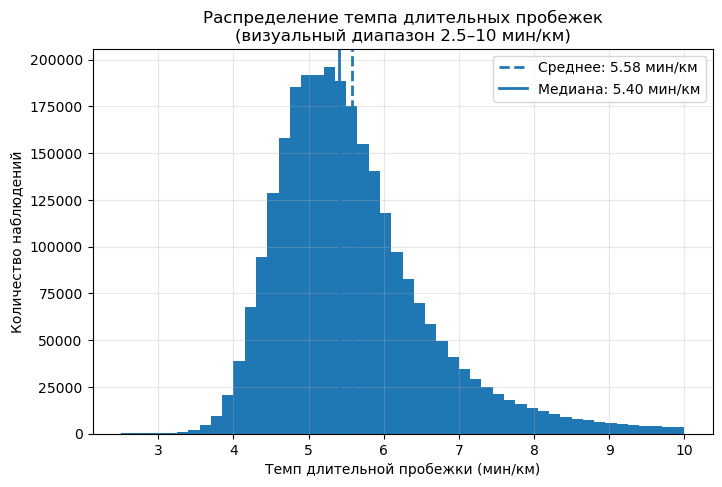

In [52]:
# Распределение темпа длительной пробежки 
pace_for_plot = data[(data['target_pace'] >= 2.5) & (data['target_pace'] <= 10)]['target_pace']
mean_pace = pace_for_plot.mean()
median_pace = pace_for_plot.median()
plt.figure(figsize=(8, 5))
plt.hist(pace_for_plot, bins=50)
plt.axvline(mean_pace, linestyle='--', linewidth=2, label=f'Среднее: {mean_pace:.2f} мин/км')
plt.axvline(median_pace, linestyle='-', linewidth=2, label=f'Медиана: {median_pace:.2f} мин/км')
plt.xlabel('Темп длительной пробежки (мин/км)')
plt.ylabel('Количество наблюдений')
plt.title('Распределение темпа длительных пробежек\n(визуальный диапазон 2.5–10 мин/км)')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

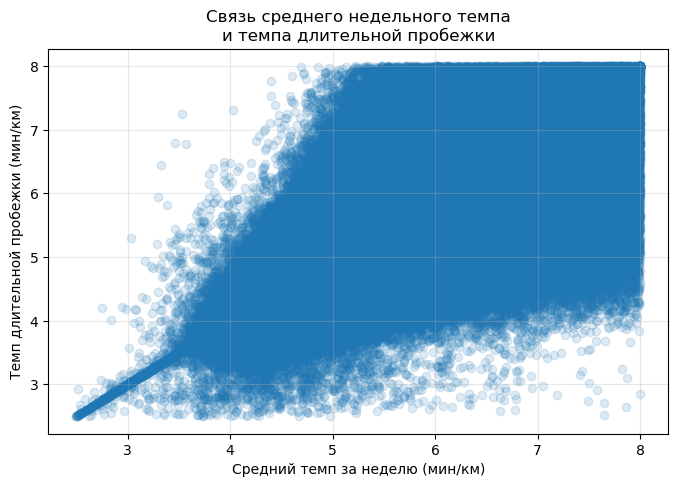

In [53]:
# Связь средней недельной скорости и темпа длительной пробежки
data_plot = data[
    (data['avg_weekly_pace'] >= 2.5) &
    (data['avg_weekly_pace'] <= 8) &
    (data['target_pace'] >= 2.5) &
    (data['target_pace'] <= 8)
]
plt.figure(figsize=(8, 5))
plt.scatter(
    data_plot['avg_weekly_pace'],
    data_plot['target_pace'],
    alpha=0.15
)
plt.xlabel('Средний темп за неделю (мин/км)')
plt.ylabel('Темп длительной пробежки (мин/км)')
plt.title('Связь среднего недельного темпа\nи темпа длительной пробежки')
plt.grid(alpha=0.3)
plt.show()

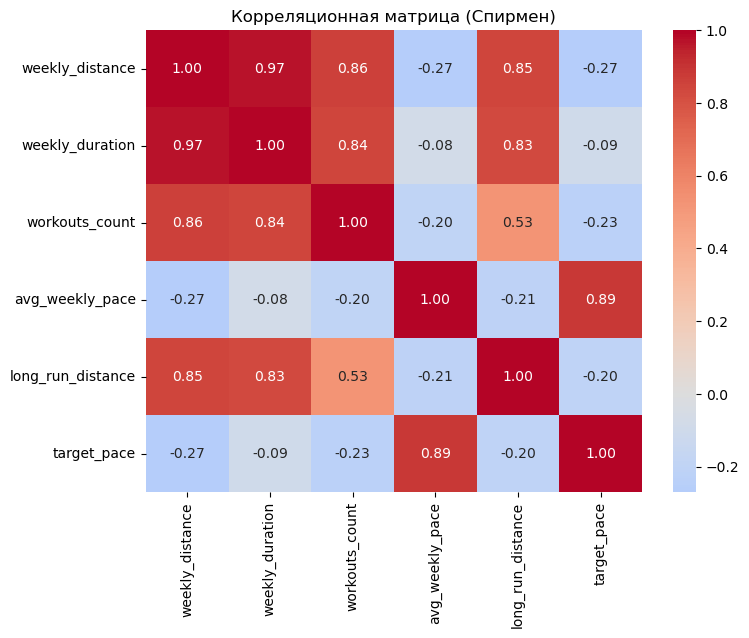

In [54]:
# Корреляционная матрица
num_cols = [
    'weekly_distance',
    'weekly_duration',
    'workouts_count',
    'avg_weekly_pace',
    'long_run_distance',
    'target_pace'
]

corr_data = data[num_cols].copy()

corr_spearman = corr_data.corr(method='spearman')

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_spearman,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0
)

plt.title('Корреляционная матрица (Спирмен)')
plt.show()

/Users/snezana/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/snezana/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/snezana/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/snezana/anaconda3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version

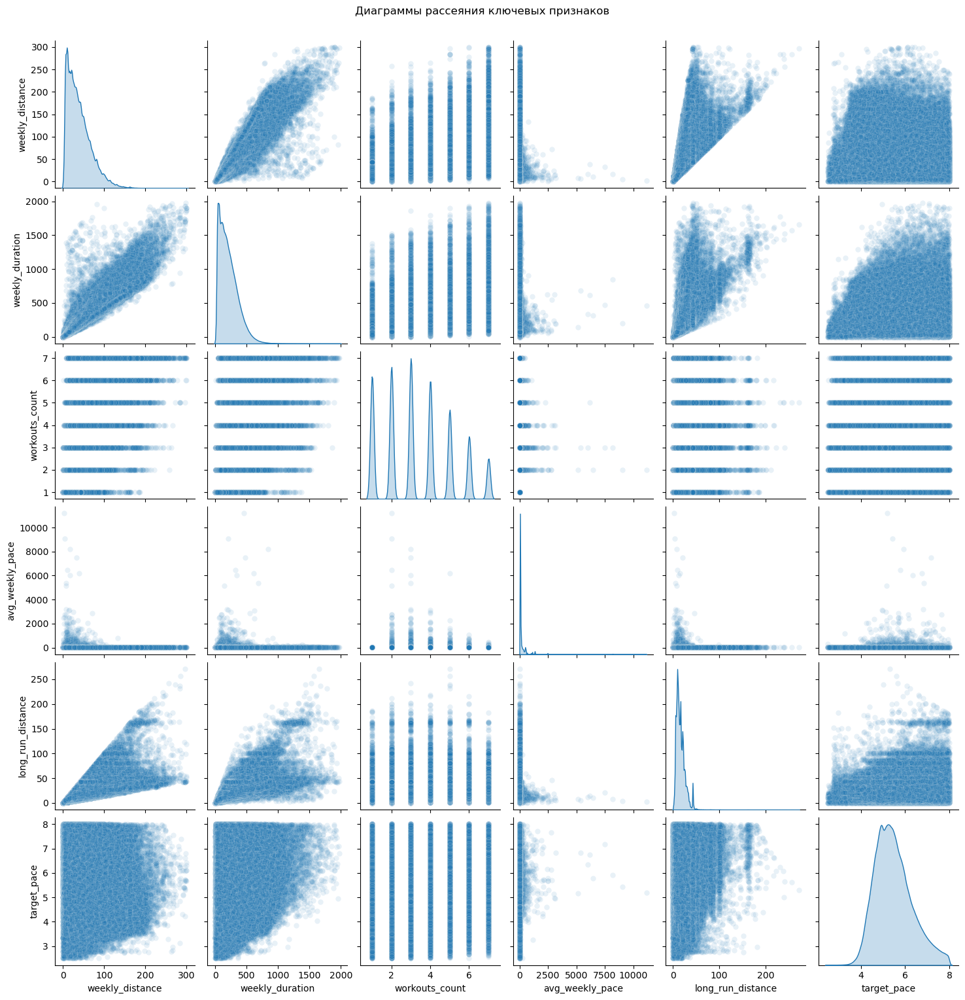

In [55]:
pairplot_data = data[
    (data['weekly_distance'] <= 300) &
    (data['weekly_duration'] <= 2000) &
    (data['target_pace'] >= 2.5) &
    (data['target_pace'] <= 8)
][num_cols]

sns.pairplot(
    pairplot_data,
    diag_kind='kde',
    plot_kws={'alpha': 0.1}
)

plt.suptitle('Диаграммы рассеяния ключевых признаков', y=1.02)
plt.show()

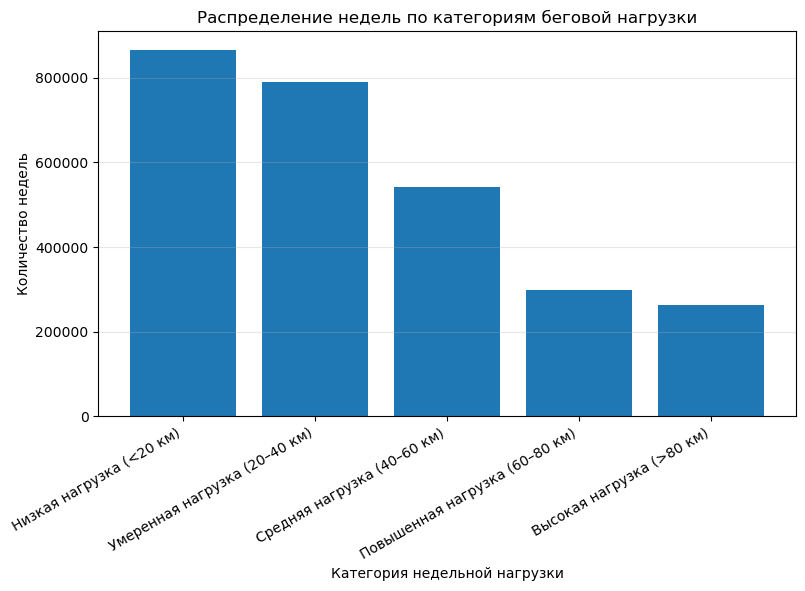

In [56]:
bins = [0, 20, 40, 60, 80, float('inf')]
labels = [
    'Низкая нагрузка (<20 км)',
    'Умеренная нагрузка (20–40 км)',
    'Средняя нагрузка (40–60 км)',
    'Повышенная нагрузка (60–80 км)',
    'Высокая нагрузка (>80 км)'
]
data['load_category'] = pd.cut(
    data['weekly_distance'],
    bins=bins,
    labels=labels,
    ordered=True)
load_counts = data['load_category'].value_counts().sort_index()
plt.figure(figsize=(9, 5))
plt.bar(
    load_counts.index,
    load_counts.values)
plt.xlabel('Категория недельной нагрузки')
plt.ylabel('Количество недель')
plt.title('Распределение недель по категориям беговой нагрузки')
plt.xticks(rotation=30, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [57]:
profile_data = ProfileReport(
    data,
    title="EDA отчёт: недельные беговые данные",
    explorative=True
)

report_data = ProfileReport(
    data,
    title="Первичный исследовательский анализ данных",
    explorative=True
)

report_data.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 15/15 [00:33<00:00,  2.25s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Создаем классы

In [58]:
def pace_to_class(pace):
    if pace < 4.0:
        return 'fast'
    elif pace < 5.0:
        return 'above_avg'
    elif pace < 6.0:
        return 'average'
    elif pace < 7.5:
        return 'slow'
    else:
        return 'very_slow'

data['pace_class'] = data['target_pace'].apply(pace_to_class)

In [59]:
data['pace_class'].value_counts(normalize=True)

pace_class
average     0.42
above_avg   0.29
slow        0.21
very_slow   0.07
fast        0.01
Name: proportion, dtype: float64

In [60]:
pace_class_legend = pd.DataFrame({
    'Класс темпа': [
        'Очень медленный',
        'Медленный',
        'Средний',
        'Выше среднего',
        'Быстрый'
    ],
    'Диапазон темпа (мин/км)': [
        '> 7:30',
        '6:00 – 7:30',
        '5:00 – 6:00',
        '4:00 – 5:00',
        '< 4:00'
    ],
    'Интерпретация': [
        'Низкоинтенсивные или восстановительные пробежки',
        'Комфортный медленный бег',
        'Типичный тренировочный темп любителей',
        'Хороший уровень подготовленности',
        'Высокий уровень беговой подготовки'
    ]
})

pace_class_legend


,Класс темпа,Диапазон темпа (мин/км),Интерпретация
0,Очень медленный,> 7:30,Низкоинтенсивные или восстановительные пробежки
1,Медленный,6:00 – 7:30,Комфортный медленный бег
2,Средний,5:00 – 6:00,Типичный тренировочный темп любителей
3,Выше среднего,4:00 – 5:00,Хороший уровень подготовленности
4,Быстрый,< 4:00,Высокий уровень беговой подготовки


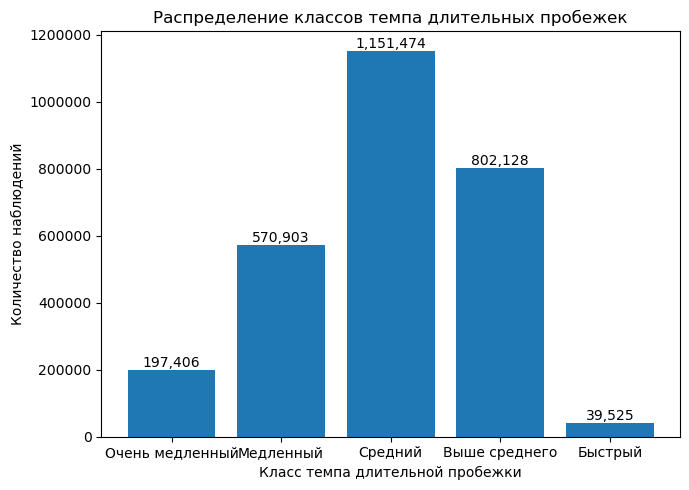

In [61]:
pace_order = ['very_slow', 'slow', 'average', 'above_avg', 'fast']
pace_labels_ru = {
    'very_slow': 'Очень медленный',
    'slow': 'Медленный',
    'average': 'Средний',
    'above_avg': 'Выше среднего',
    'fast': 'Быстрый'
}
pace_class_counts = (data['pace_class'].value_counts().reindex(pace_order))
plt.figure(figsize=(7, 5))
plt.bar([pace_labels_ru[c] for c in pace_class_counts.index],pace_class_counts.values)
plt.xlabel('Класс темпа длительной пробежки')
plt.ylabel('Количество наблюдений')
plt.title('Распределение классов темпа длительных пробежек')
plt.ticklabel_format(axis='y', style='plain')
for i, v in enumerate(pace_class_counts.values):
    plt.text(i, v, f'{v:,}', ha='center', va='bottom')
plt.tight_layout()
plt.show()

# Обучение

В рамках работы были реализованы и сравнены четыре модели классификации, представляющие различные классы алгоритмов машинного обучения: линейный, метрический, логический и ансамблевый. Для всех моделей применялся единый подход к подбору гиперпараметров с использованием перекрёстной проверки и оптимизации по метрике F1-macro, что обеспечивало корректное сравнение моделей в условиях несбалансированного распределения классов.

In [62]:
model_data = data[data["long_run_distance"] >= 10].copy()

drop_cols = ["athlete", "year", "week", "volume_category", "load_category", "target_pace"]
drop_cols = [c for c in drop_cols if c in model_data.columns]

X = model_data.drop(columns=drop_cols + ["pace_class"]).copy()
y = model_data["pace_class"].copy()

In [63]:
num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_features = X.select_dtypes(include=["object", "category", "bool"]).columns.tolist()
print("Числовые признаки:", num_features)
print("Категориальные признаки:", cat_features)
print("Классы:", y.value_counts(dropna=False))

Числовые признаки: ['weekly_distance', 'weekly_duration', 'workouts_count', 'avg_weekly_pace', 'long_run_distance', 'long_run_duration']
Категориальные признаки: ['gender', 'age_group', 'country', 'target_pace_str']
Классы: pace_class
average      819573
above_avg    653934
slow         348497
very_slow    112784
fast          33690
Name: count, dtype: int64


In [64]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(gss.split(X, y, groups=model_data["athlete"]))

X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)
print("Уникальных бегунов в train:", model_data.iloc[train_idx]["athlete"].nunique())
print("Уникальных бегунов в test:", model_data.iloc[test_idx]["athlete"].nunique())

Train shape: (1578325, 10)
Test shape: (390153, 10)
Уникальных бегунов в train: 28341
Уникальных бегунов в test: 7086


In [65]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_features)
    ])

In [66]:
def evaluate_model(model, X_test, y_test):
    t0 = time.time()
    y_pred = model.predict(X_test)
    pred_time = time.time() - t0

    metrics = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision_macro": precision_score(y_test, y_pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_test, y_pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_test, y_pred, average="macro", zero_division=0),
        "predict_time_sec": pred_time
    }

    # ROC-AUC для мультикласса считаем только если есть predict_proba
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)
        metrics["roc_auc_ovr_weighted"] = roc_auc_score(
            y_test, y_proba, multi_class="ovr", average="weighted"
        )
    else:
        metrics["roc_auc_ovr_weighted"] = np.nan

    return metrics  

In [67]:
# Ограничим размер train для ускорения
MAX_TRAIN_SIZE = 300_000

if len(X_train) > MAX_TRAIN_SIZE:
    X_train_small, _, y_train_small, _ = train_test_split(
        X_train, y_train,
        train_size=MAX_TRAIN_SIZE,
        stratify=y_train,
        random_state=42
    )
else:
    X_train_small = X_train
    y_train_small = y_train

print("Train used:", X_train_small.shape)

Train used: (300000, 10)


In [68]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

#### Логистическая регрессия

In [69]:
log_reg_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", LogisticRegression(max_iter=1000, n_jobs=-1, multi_class="auto"))
])

log_reg_param_grid = {
    "clf__C": [0.01, 0.1, 1, 10],
    "clf__penalty": ["l2"],
    "clf__solver": ["lbfgs"]
}

log_reg_grid = GridSearchCV(
    estimator=log_reg_pipeline,
    param_grid=log_reg_param_grid,
    scoring="f1_macro",
    cv=cv,
    n_jobs=-1,
    verbose=1
)

t0 = time.time()
log_reg_grid.fit(X_train_small, y_train_small)
log_reg_fit_time = time.time() - t0

best_log_reg = log_reg_grid.best_estimator_
res_log_reg = evaluate_model(best_log_reg, X_test, y_test)
res_log_reg["fit_time_sec"] = log_reg_fit_time

print("Best params (LogReg):", log_reg_grid.best_params_)
print(res_log_reg)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
/Users/snezana/anaconda3/lib/python3.10/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pand

Best params (LogReg): {'clf__C': 10, 'clf__penalty': 'l2', 'clf__solver': 'lbfgs'}
{'accuracy': 0.9996232247349117, 'precision_macro': 0.9990459053888827, 'recall_macro': 0.9993331182223321, 'f1_macro': 0.9991892757787694, 'predict_time_sec': 1.076678991317749, 'roc_auc_ovr_weighted': 0.9999992006029511, 'fit_time_sec': 168.18060684204102}


#### KNN - метод ближайших соседей

In [72]:
num_only_preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features)
    ],
    remainder="drop"
)

knn_pipeline_fast = Pipeline([
    ("preprocessor", num_only_preprocessor),
    ("clf", KNeighborsClassifier())
])

knn_param_grid_fast = {
    "clf__n_neighbors": [5, 9, 15],
    "clf__weights": ["uniform", "distance"],
    "clf__metric": ["euclidean", "manhattan"]
}

knn_grid_fast = GridSearchCV(
    knn_pipeline_fast,
    knn_param_grid_fast,
    scoring="f1_macro",      
    cv=3,
    n_jobs=-1,
    verbose=1
)

t0 = time.time()
knn_grid_fast.fit(X_train_small, y_train_small)
knn_fit_time = time.time() - t0

best_knn = knn_grid_fast.best_estimator_
res_knn = evaluate_model(best_knn, X_test, y_test)

print("Best params (KNN):", knn_grid_fast.best_params_)
print(res_knn)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best params (KNN): {'clf__metric': 'euclidean', 'clf__n_neighbors': 5, 'clf__weights': 'distance'}
{'accuracy': 0.9357969822095434, 'precision_macro': 0.935704983347852, 'recall_macro': 0.8584274631988107, 'f1_macro': 0.8878269796504712, 'predict_time_sec': 32.35044026374817, 'roc_auc_ovr_weighted': 0.9900295161318352}


#### Дерево решений

In [73]:
tree_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", DecisionTreeClassifier(random_state=42))
])

tree_param_grid = {
    "clf__criterion": ["gini", "entropy"],
    "clf__max_depth": [6, 10, None],
    "clf__min_samples_leaf": [1, 2, 5]
}

tree_grid = GridSearchCV(
    estimator=tree_pipeline,
    param_grid=tree_param_grid,
    scoring="f1_macro",
    cv=cv,
    n_jobs=-1,
    verbose=1
)

t0 = time.time()
tree_grid.fit(X_train_small, y_train_small)
tree_fit_time = time.time() - t0

best_tree = tree_grid.best_estimator_
res_tree = evaluate_model(best_tree, X_test, y_test)
res_tree["fit_time_sec"] = tree_fit_time

print("Best params (Tree):", tree_grid.best_params_)
print(res_tree)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
Best params (Tree): {'clf__criterion': 'gini', 'clf__max_depth': None, 'clf__min_samples_leaf': 1}
{'accuracy': 0.9917058179739743, 'precision_macro': 0.9867073540677296, 'recall_macro': 0.9827724173010137, 'f1_macro': 0.9847255565214775, 'predict_time_sec': 1.5199201107025146, 'roc_auc_ovr_weighted': 0.994398927437376, 'fit_time_sec': 300.70459389686584}


#### HistGradientBoostingClassifier

In [74]:
ordinal_preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_features),
        ("cat", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1), cat_features)
    ],
    remainder="drop"
)

hgb_pipeline = Pipeline([
    ("preprocessor", ordinal_preprocessor), 
    ("clf", HistGradientBoostingClassifier(random_state=42))
])

hgb_param_dist = {
    "clf__learning_rate": [0.03, 0.05, 0.1],
    "clf__max_depth": [3, 5, None],
    "clf__max_iter": [100, 150, 200],
    "clf__min_samples_leaf": [20, 50, 100]
}

hgb_search = RandomizedSearchCV(
    estimator=hgb_pipeline,
    param_distributions=hgb_param_dist,
    n_iter=12,
    scoring="f1_macro",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    random_state=42
)

t0 = time.time()
hgb_search.fit(X_train_small, y_train_small)
hgb_fit_time = time.time() - t0

best_hgb = hgb_search.best_estimator_
res_hgb = evaluate_model(best_hgb, X_test, y_test)
res_hgb["fit_time_sec"] = hgb_fit_time

print("Best params (HistGradientBoostingClassifier):", hgb_search.best_params_)
print(res_hgb)


Fitting 3 folds for each of 12 candidates, totalling 36 fits
Best params (HistGradientBoostingClassifier): {'clf__min_samples_leaf': 50, 'clf__max_iter': 150, 'clf__max_depth': 3, 'clf__learning_rate': 0.05}
{'accuracy': 0.9959246757041469, 'precision_macro': 0.9881415176814363, 'recall_macro': 0.9848559499482317, 'f1_macro': 0.9864864780620166, 'predict_time_sec': 5.16369366645813, 'roc_auc_ovr_weighted': 0.9999871737722139, 'fit_time_sec': 340.42162466049194}


In [75]:
results = pd.DataFrame([
    {"model": "Logistic Regression", **res_log_reg},
    {"model": "KNN", **res_knn},
    {"model": "Decision Tree", **res_tree},
    {"model": "HistGradientBoosting", **res_hgb}
])

results = results[[
    "model", "roc_auc_ovr_weighted", "accuracy",
    "precision_macro", "recall_macro", "f1_macro",
    "fit_time_sec", "predict_time_sec"
]].sort_values("f1_macro", ascending=False)

print(results)

                  model  roc_auc_ovr_weighted  accuracy  precision_macro  \
0   Logistic Regression                  1.00      1.00             1.00   
3  HistGradientBoosting                  1.00      1.00             0.99   
2         Decision Tree                  0.99      0.99             0.99   
1                   KNN                  0.99      0.94             0.94   

   recall_macro  f1_macro  fit_time_sec  predict_time_sec  
0          1.00      1.00        168.18              1.08  
3          0.98      0.99        340.42              5.16  
2          0.98      0.98        300.70              1.52  
1          0.86      0.89           NaN             32.35  


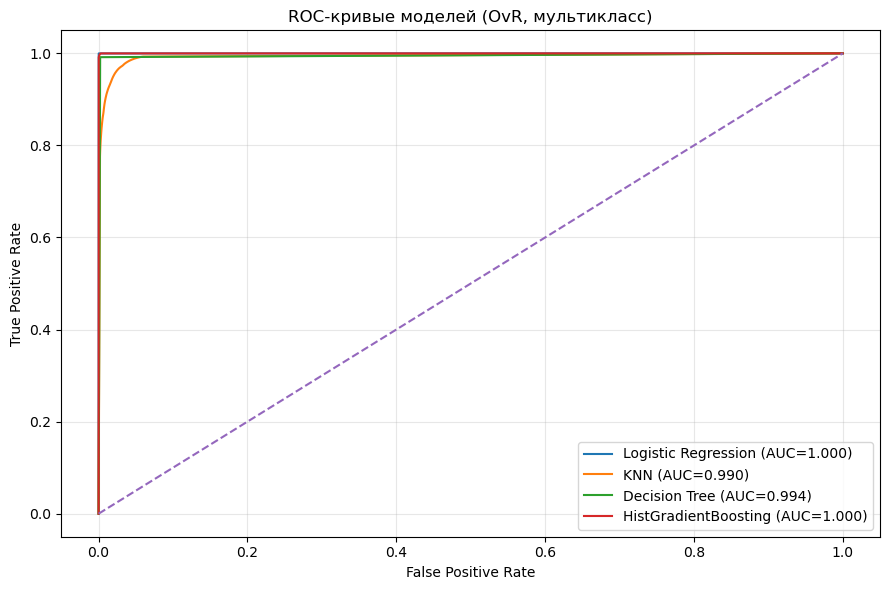

In [ ]:
models = {
    "Logistic Regression": best_log_reg,
    "KNN": best_knn,
    "Decision Tree": best_tree,
    "HistGradientBoosting": best_hgb
}

classes = np.sort(y_test.unique())
y_test_bin = label_binarize(y_test, classes=classes)

plt.figure(figsize=(9, 6))

for name, model in models.items():
    if not hasattr(model, "predict_proba"):
        continue
    proba = model.predict_proba(X_test)
    # micro-average ROC
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), proba.ravel())
    auc = roc_auc_score(y_test, proba, multi_class="ovr", average="weighted")
    plt.plot(fpr, tpr, label=f"{name} (AUC={auc:.3f})")

plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-кривые моделей (OvR, мультикласс)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

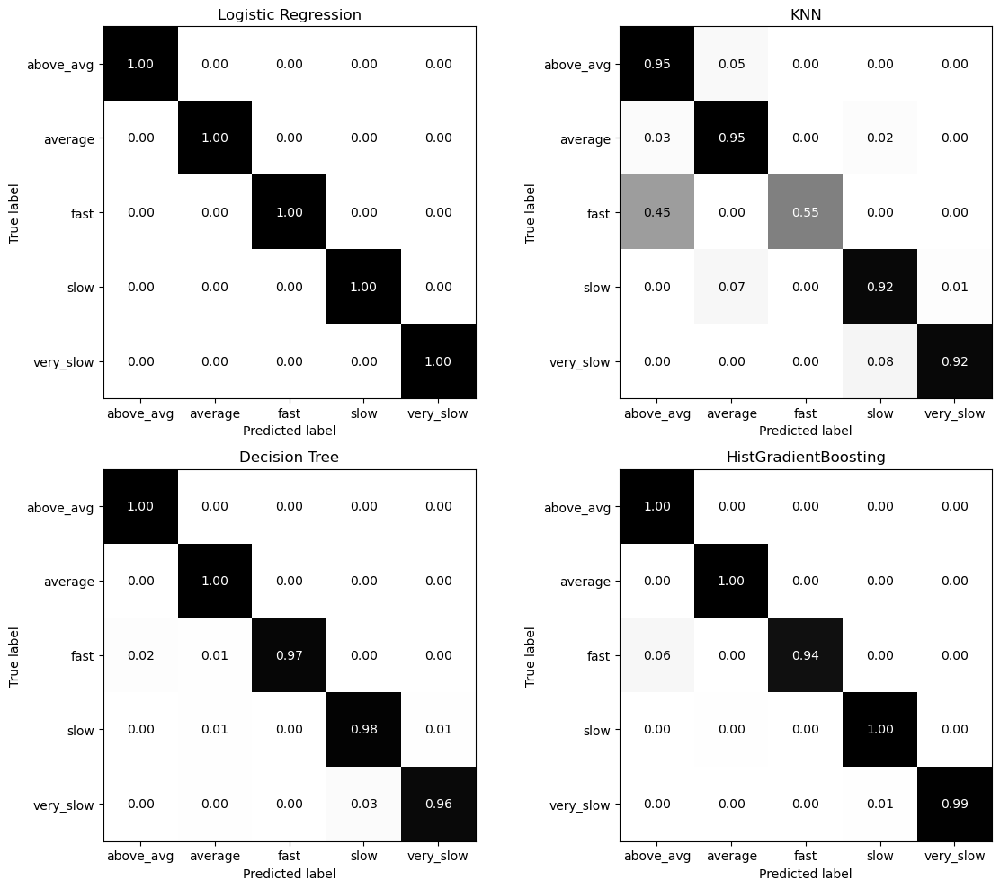

In [77]:
labels = list(classes)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for ax, (name, model) in zip(axes, models.items()):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred, normalize="true")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(ax=ax, cmap="Greys", values_format=".2f", colorbar=False)
    ax.set_title(name)

plt.tight_layout()
plt.show()

In [83]:
pd.set_option('display.float_format', '{:.5f}'.format)

In [84]:
models = {
    "Logistic Regression": best_log_reg,
    "KNN": best_knn,
    "Decision Tree": best_tree,
    "HistGradientBoosting": best_hgb
}

results_df = (
    pd.DataFrame({name: evaluate_model(m, X_test, y_test) for name, m in models.items()})
      .T
      .rename(columns={
          "precision_macro": "precision",
          "recall_macro": "recall",
          "f1_macro": "f1",
          "roc_auc_ovr_weighted": "roc_auc"
      })
      .reset_index()
      .rename(columns={"index": "model"})
      [["model", "accuracy", "precision", "recall", "f1", "roc_auc", "predict_time_sec"]]
)

results_df

,model,accuracy,precision,recall,f1,roc_auc,predict_time_sec
0,Logistic Regression,0.99962,0.99905,0.99933,0.99919,1.00000,1.09405
1,KNN,0.93580,0.93570,0.85843,0.88783,0.99003,37.48404
2,Decision Tree,0.99171,0.98671,0.98277,0.98473,0.99440,1.40525
3,HistGradientBoosting,0.99592,0.98814,0.98486,0.98649,0.99999,28.88055


Pезультаты экспериментов показывают, что для задачи классификации бегунов по темпу длительных пробежек наиболее эффективными являются линейная модель логистической регрессии и ансамблевый метод HistGradientBoostingClassifier. Логистическая регрессия обеспечивает оптимальное сочетание точности и скорости работы, тогда как HistGradientBoostingClassifier демонстрирует высокую устойчивость при моделировании сложных нелинейных зависимостей. Метод k ближайших соседей, несмотря на приемлемые значения ROC-AUC, обладает выраженными вычислительными ограничениями и менее подходит для анализа крупных тренировочных датасетов.